***
# <div align="center">Gender Classification from voice data</div>
#### <div align="right">DHIVAKAR K<br>CB.EN.U4CSE18314</div>
#### <div align="right">M SAI GHOWTHAM<br>CB.EN.U4CSE18338</div>
***

## Dataset Description:
In order to analyze gender by voice and speech, a training database was required. A database was built using thousands of samples of male and female voices, each labeled by their gender of male or female. Voice samples were collected from the following resources:

* The Harvard-Haskins Database of Regularly-Timed Speech
* Telecommunications & Signal Processing Laboratory (TSP) Speech Database at McGill University
* VoxForge Speech Corpus
* Festvox CMU_ARCTIC Speech Database at Carnegie Mellon University

Each voice sample is stored as a .WAV file, which is then pre-processed for acoustic analysis using the specan function from the WarbleR R package. Specan measures 22 acoustic parameters on acoustic signals for which the start and end times are provided.

The output from the pre-processed WAV files were saved into a CSV file, containing 3168 rows and 21 columns (20 columns for each feature and one label column for the classification of male or female). You can download the pre-processed dataset in CSV format, using the link above

#### Acoustic Properties Measured
The following acoustic properties of each voice are measured:

* duration: length of signal
* meanfreq: mean frequency (in kHz)
* sd: standard deviation of frequency
* median: median frequency (in kHz)
* Q25: first quantile (in kHz)
* Q75: third quantile (in kHz)
* IQR: interquantile range (in kHz)
* skew: skewness (see note in specprop description)
* kurt: kurtosis (see note in specprop description)
* sp.ent: spectral entropy
* sfm: spectral flatness
* mode: mode frequency
* centroid: frequency centroid (see specprop)
* peakf: peak frequency (frequency with highest energy)
* meanfun: average of fundamental frequency measured across acoustic signal
* minfun: minimum fundamental frequency measured across acoustic signal
* maxfun: maximum fundamental frequency measured across acoustic signal
* meandom: average of dominant frequency measured across acoustic signal
* mindom: minimum of dominant frequency measured across acoustic signal
* maxdom: maximum of dominant frequency measured across acoustic signal
* dfrange: range of dominant frequency measured across acoustic signal
* modindx: modulation index. Calculated as the accumulated absolute difference between adjacent measurements of fundamental frequencies divided by the frequency range

Note, the features for duration and peak frequency (peakf) were removed from training. Duration refers to the length of the recording, which for training, is cut off at 20 seconds. Peakf was omitted from calculation due to time and CPU constraints in calculating the value. In this case, all records will have the same value for duration (20) and peak frequency (0).

***
## Importing Necessary Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pylab as pl

import librosa.display

import sklearn
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import sklearn.metrics as metrics
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objs as go
import plotly.offline as py
from sklearn.metrics import accuracy_score,precision_score,roc_curve,roc_auc_score,classification_report,confusion_matrix

#Ignore  the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

#plotting missing data
import missingno as msno
import librosa

import IPython.display as display
import statistics as st

#classification models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import KFold,cross_val_score
from sklearn.ensemble import VotingClassifier

from sklearn.pipeline import Pipeline
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import ExtraTreeClassifier
from sklearn.linear_model import RidgeClassifier

#Neural network building libraries
from tensorflow import keras 
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import History 
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import SGD

import scipy
from spafe.utils.spectral import stft, rfft
from spafe.features import spfeats
from spafe.frequencies.dominant_frequencies import get_dominant_frequencies
from spafe.frequencies.fundamental_frequencies import FundamentalFrequenciesExtractor

***
## Load The Dataset

In [2]:
vgdata=pd.read_csv("voice/voice.csv")
vgdata.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male


In [3]:
vgdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3168 entries, 0 to 3167
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   meanfreq  3168 non-null   float64
 1   sd        3168 non-null   float64
 2   median    3168 non-null   float64
 3   Q25       3168 non-null   float64
 4   Q75       3168 non-null   float64
 5   IQR       3168 non-null   float64
 6   skew      3168 non-null   float64
 7   kurt      3168 non-null   float64
 8   sp.ent    3168 non-null   float64
 9   sfm       3168 non-null   float64
 10  mode      3168 non-null   float64
 11  centroid  3168 non-null   float64
 12  meanfun   3168 non-null   float64
 13  minfun    3168 non-null   float64
 14  maxfun    3168 non-null   float64
 15  meandom   3168 non-null   float64
 16  mindom    3168 non-null   float64
 17  maxdom    3168 non-null   float64
 18  dfrange   3168 non-null   float64
 19  modindx   3168 non-null   float64
 20  label     3168 non-null   obje

In [4]:
vgdata.describe()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
count,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000
mean,0.180907,0.057126,0.185621,0.140456,0.224765,0.084309,3.140168,36.568461,0.895127,0.408216,0.165282,0.180907,0.142807,0.036802,0.258842,0.829211,0.052647,5.047277,4.994630,0.173752
std,0.029918,0.016652,0.036360,0.048680,0.023639,0.042783,4.240529,134.928661,0.044980,0.177521,0.077203,0.029918,0.032304,0.019220,0.030077,0.525205,0.063299,3.521157,3.520039,0.119454
min,0.039363,0.018363,0.010975,0.000229,0.042946,0.014558,0.141735,2.068455,0.738651,0.036876,0.000000,0.039363,0.055565,0.009775,0.103093,0.007812,0.004883,0.007812,0.000000,0.000000
25%,0.163662,0.041954,0.169593,0.111087,0.208747,0.042560,1.649569,5.669547,0.861811,0.258041,0.118016,0.163662,0.116998,0.018223,0.253968,0.419828,0.007812,2.070312,2.044922,0.099766
50%,0.184838,0.059155,0.190032,0.140286,0.225684,0.094280,2.197101,8.318463,0.901767,0.396335,0.186599,0.184838,0.140519,0.046110,0.271186,0.765795,0.023438,4.992188,4.945312,0.139357
75%,0.199146,0.067020,0.210618,0.175939,0.243660,0.114175,2.931694,13.648905,0.928713,0.533676,0.221104,0.199146,0.169581,0.047904,0.277457,1.177166,0.070312,7.007812,6.992188,0.209183
max,0.251124,0.115273,0.261224,0.247347,0.273469,0.252225,34.725453,1309.612887,0.981997,0.842936,0.280000,0.251124,0.237636,0.204082,0.279114,2.957682,0.458984,21.867188,21.843750,0.932374


***
#### Checking for NAN

In [5]:
vgdata.isna().sum()

meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
kurt        0
sp.ent      0
sfm         0
mode        0
centroid    0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
label       0
dtype: int64

***
### Distribution of target varibles

male      1584
female    1584
Name: label, dtype: int64


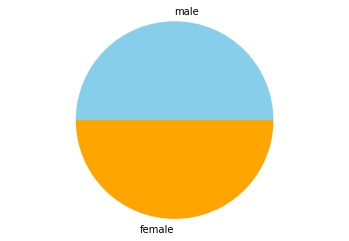

In [6]:
data=vgdata.copy()
colors = ['skyblue','orange']
df = data[data.columns[-1]]
plt.pie(df.value_counts(),colors=colors,labels=['male','female'])
plt.axis('equal')
print (data['label'].value_counts())

<AxesSubplot:>

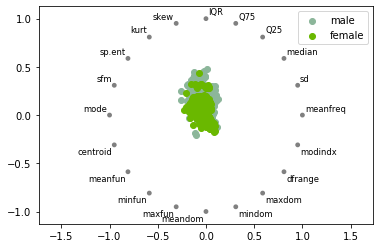

In [7]:
pd.plotting.radviz(data,"label")

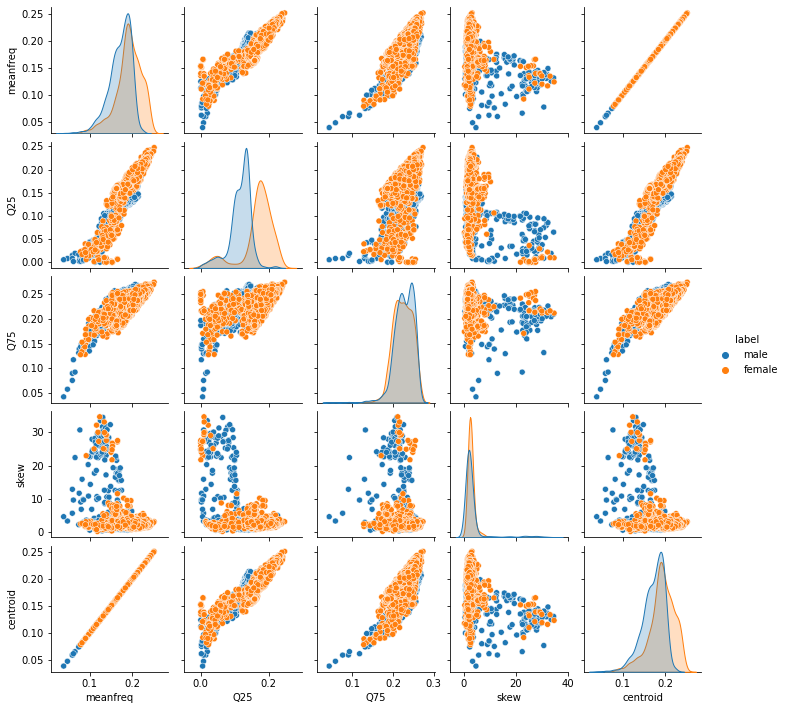

In [8]:
sns.pairplot(data[['meanfreq', 'Q25', 'Q75','skew', 'centroid', 'label']], hue='label', size=2)

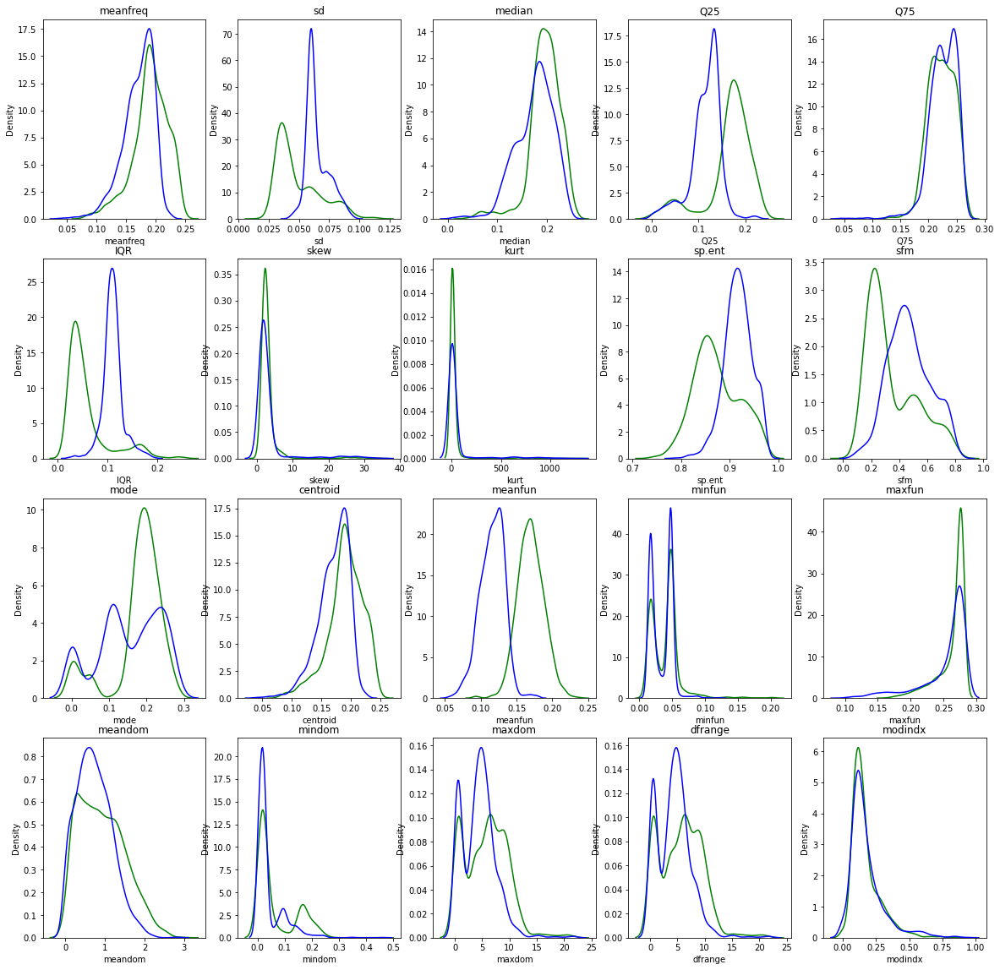

In [9]:
import seaborn as sns
plt.subplots(4,5,figsize = (20,20))
X = data.iloc[:,:-1]
y = data.iloc[:,20]

for i in range(1,21):
    plt.subplot(4,5,i)
    plt.title(data.columns[i-1])
    
    sns.kdeplot(data.loc[y == "female", data.columns[i-1]], color = "green",label = "F")
    sns.kdeplot(data.loc[y == "male", data.columns[i-1]], color = "blue", label = "M")

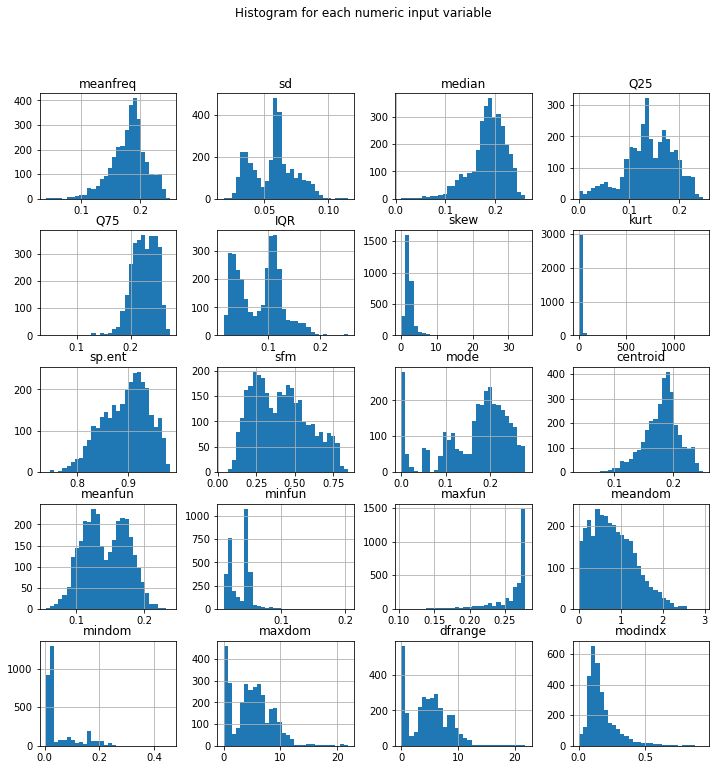

In [10]:
data.drop('label' ,axis=1).hist(bins=30, figsize=(12,12))
pl.suptitle("Histogram for each numeric input variable")
plt.show()

<AxesSubplot:>

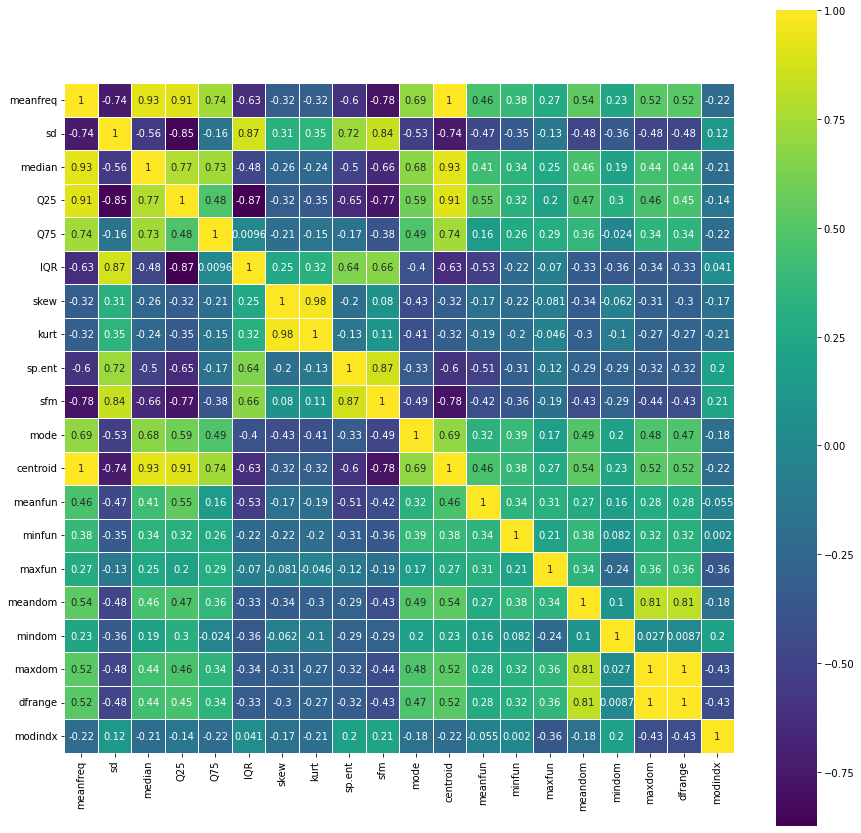

In [11]:
#corelation matrix.
cor_mat= data[:].corr()
mask = np.array(cor_mat)
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(15,15)
sns.heatmap(data=cor_mat,square=True,annot=True,cbar=True,cmap='viridis',linewidth=0.5)

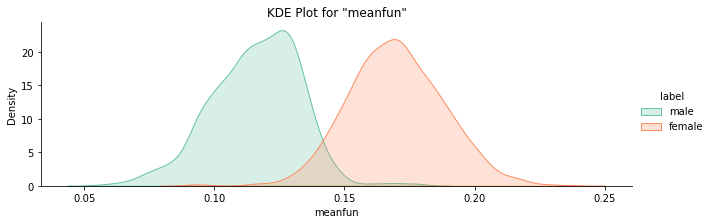

In [12]:
fig = sns.FacetGrid(data, hue = "label", aspect = 3, palette = "Set2")
fig.map(sns.kdeplot, "meanfun", shade = True)
fig.add_legend()

plt.title('KDE Plot for "meanfun"')
plt.show(fig)

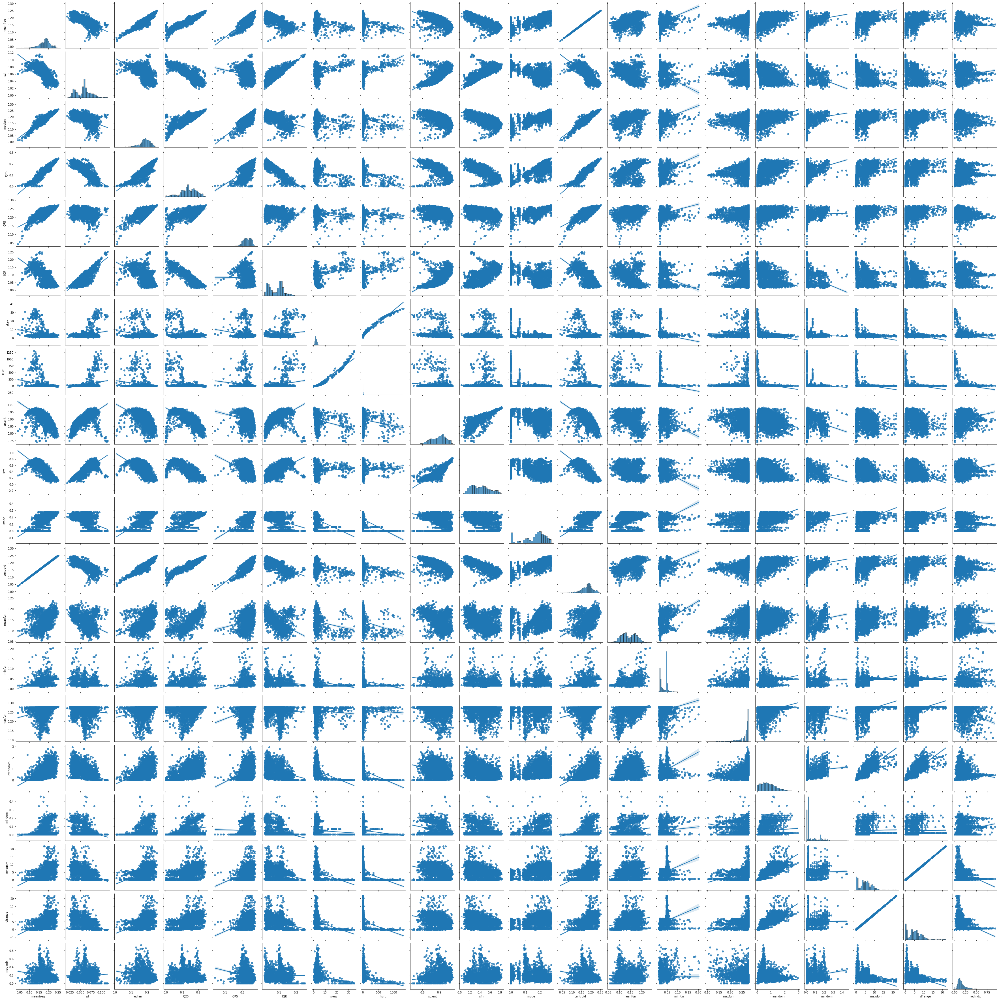

In [13]:
g = sns.pairplot(data, kind='reg')

Text(0, 0.5, 'Probability')

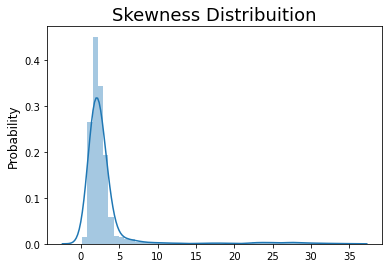

In [14]:
g = sns.distplot(data['skew'])
g.set_title("Skewness Distribuition", fontsize=18)
g.set_xlabel("")
g.set_ylabel("Probability", fontsize=12)

<AxesSubplot:xlabel='dfrange', ylabel='Density'>

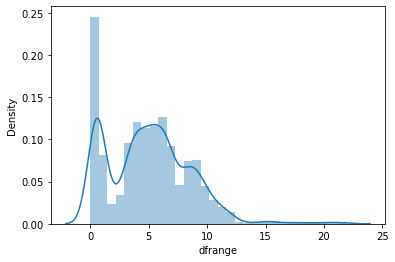

In [15]:
sns.distplot(data['dfrange'],bins=30)

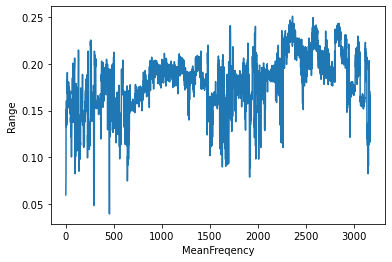

In [16]:
plt.plot(data['meanfreq'])
plt.xlabel('MeanFreqency')
plt.ylabel('Range')
plt.show()

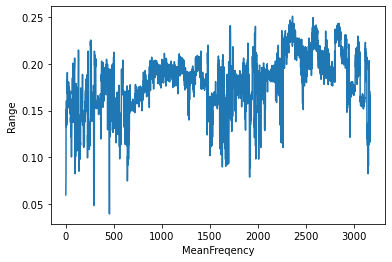

In [17]:
plt.plot(data['meanfreq'])
plt.xlabel('MeanFreqency')
plt.ylabel('Range')
plt.show()

In [18]:
trace = go.Scatter(x=data['minfun'], y=data['maxfun'],
                    mode='markers',
                    name='markers')

layout = dict(title =  'Plot b/w Minfun & Maxfun')
                    
fig = dict(data = [trace], layout=layout)
py.iplot(fig)

In [19]:
trace = go.Scatter(x=data['meanfreq'], y=data['sd'],
                    mode='markers',
                    name='markers')

layout = dict(title =  'Plot b/w meanfreq & sd')
                    
fig = dict(data = [trace], layout=layout)
py.iplot(fig)

In [20]:
trace = go.Scatter(x=data['skew'], y=data['kurt'],
                    mode='markers',
                    name='markers')

layout = dict(title =  'Plot b/w skewness & kurtosis')
                    
fig = dict(data = [trace], layout=layout)
py.iplot(fig)

***
## Various Ml Models Training and Comparision

In [21]:
vgdata.label = vgdata.label.apply(lambda x: 1 if x == 'male' else 0)
X = vgdata.drop('label',1)
y = vgdata.label

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1008)

In [22]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [23]:
num_folds = 10
seed = 3
scoring = 'accuracy'

In [24]:
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('SVM', SVC()))
models.append(('NB', GaussianNB()))
models.append(('KNN', KNeighborsClassifier()))
models.append(("XGB", XGBClassifier(eval_metric='mlogloss')))
models.append(("ET", ExtraTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("GB", GradientBoostingClassifier(max_features=15,n_estimators=600)))
models.append(("RC", RidgeClassifier()))

results = []
names = []
for name, model in models:
    kfold = KFold(n_splits = num_folds, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv = kfold, scoring = scoring)
    results.append(cv_results.mean())
    names.append(name)
    msg = "%s:\t%f"%(name, cv_results.mean())
    print(msg)

LR:	0.975959
LDA:	0.968421
CART:	0.966556
SVM:	0.980202
NB:	0.883105
KNN:	0.970305
XGB:	0.979730
ET:	0.944379
RF:	0.979263
GB:	0.982087
RC:	0.968421


Text(0.5, 1.0, 'ML classifiers and Accuracy score')

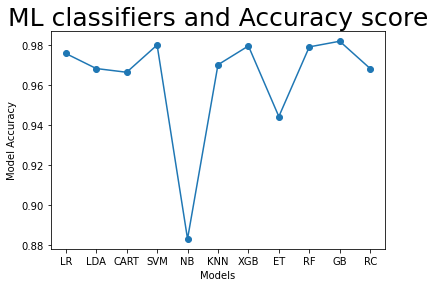

In [25]:
plt.plot(names,results,marker='o')
plt.xlabel('Models')
plt.ylabel('Model Accuracy')
plt.title('ML classifiers and Accuracy score',size=25)

In [26]:
num_folds = 10
scoring = 'accuracy'

In [27]:
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('SVM', SVC()))
models.append(('NB', GaussianNB()))
models.append(('KNN', KNeighborsClassifier()))
models.append(("XGB", XGBClassifier(eval_metric='mlogloss')))
models.append(("ET", ExtraTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("GB", GradientBoostingClassifier(max_features=15,n_estimators=600)))
models.append(("RC", RidgeClassifier()))

results = []
names = []
for name, model in models:
    kfold = KFold(n_splits = num_folds)
    cv_results = cross_val_score(model, X_train, y_train, cv = kfold, scoring = scoring)
    results.append(cv_results.mean())
    names.append(name)
    msg = "%s:\t%f"%(name, cv_results.mean())
    print(msg)

LR:	0.976907
LDA:	0.968894
CART:	0.963706
SVM:	0.980198
NB:	0.881238
KNN:	0.970772
XGB:	0.980202
ET:	0.942510
RF:	0.978311
GB:	0.980674
RC:	0.969364


Text(0.5, 1.0, 'ML classifiers and Accuracy score')

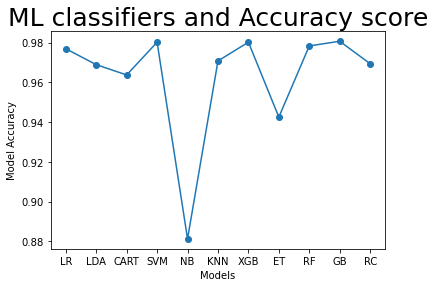

In [28]:
plt.plot(names,results,marker='o')
plt.xlabel('Models')
plt.ylabel('Model Accuracy')
plt.title('ML classifiers and Accuracy score',size=25)

In [29]:
for name,model in models:
    print(name)
    model.fit(X_train,y_train)
    pred=model.predict(X_test)
    print(accuracy_score(y_test, pred))
    print(confusion_matrix(y_test, pred))
    print(classification_report(y_test, pred))
    print("-"*53)

LR
0.9665391969407265
[[513  21]
 [ 14 498]]
              precision    recall  f1-score   support

           0       0.97      0.96      0.97       534
           1       0.96      0.97      0.97       512

    accuracy                           0.97      1046
   macro avg       0.97      0.97      0.97      1046
weighted avg       0.97      0.97      0.97      1046

-----------------------------------------------------
LDA
0.9674952198852772
[[512  22]
 [ 12 500]]
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       534
           1       0.96      0.98      0.97       512

    accuracy                           0.97      1046
   macro avg       0.97      0.97      0.97      1046
weighted avg       0.97      0.97      0.97      1046

-----------------------------------------------------
CART
0.9646271510516252
[[516  18]
 [ 19 493]]
              precision    recall  f1-score   support

           0       0.96      0.97      0.97  

***
## Voting Ensemble

In [30]:
models = []
models.append(('SVM', SVC()))
models.append(("XGB", XGBClassifier(eval_metric='mlogloss')))
models.append(("RF", RandomForestClassifier()))
models.append(("GB", GradientBoostingClassifier(max_features=15,n_estimators=600)))

In [31]:
ensemble = VotingClassifier(estimators=models, voting='hard')

In [32]:
ensemble.fit(X_train,y_train)
pred=ensemble.predict(X_test)
print(accuracy_score(y_test, pred))
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("-"*53)

0.9780114722753346
[[525   9]
 [ 14 498]]
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       534
           1       0.98      0.97      0.98       512

    accuracy                           0.98      1046
   macro avg       0.98      0.98      0.98      1046
weighted avg       0.98      0.98      0.98      1046

-----------------------------------------------------


***
## Function to Extract Feature from a wav file

In [33]:
audio, rate = librosa.load("D:/Study/Sem7/Final Year/VoiceGender/aud1.wav",sr=16000)
aud, rat = librosa.load("D:/Study/Sem7/Final Year/VoiceGender/aud1.wav")
display.Audio(data=aud, rate=rat, autoplay=False)

In [34]:
audio1, rate1 = librosa.load("D:/Study/Sem7/Final Year/VoiceGender/aud2.wav",sr=16000)
aud1, rat1 = librosa.load("D:/Study/Sem7/Final Year/VoiceGender/aud2.wav")
display.Audio(data=aud1, rate=rat, autoplay=False)

In [35]:
spectral_centroids = librosa.feature.spectral_centroid(aud, sr=rat)[0]
spectral_centroids.shape

(315,)

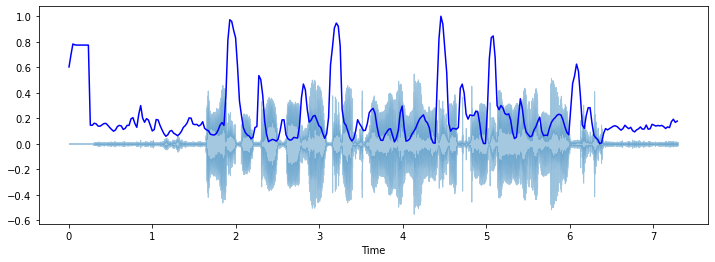

In [36]:
# Computing the time variable for visualization
plt.figure(figsize=(12, 4))
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveshow(aud, sr=rat, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='b')

In [37]:
spectral_centroids1 = librosa.feature.spectral_centroid(aud1, sr=rat1)[0]
spectral_centroids1.shape

(199,)

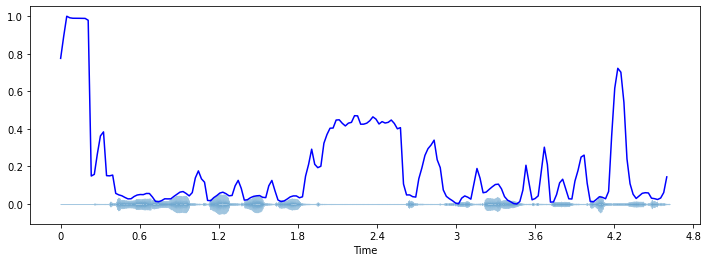

In [38]:
# Computing the time variable for visualization
plt.figure(figsize=(12, 4))
frames = range(len(spectral_centroids1))
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveshow(aud1, sr=rat1, alpha=0.4)
plt.plot(t, normalize(spectral_centroids1), color='b')

In [39]:
def compute_fund_freqs(sig, fs):
    """
    compute fundamental frequencies.
    Args:
        centroid (float) : spectral centroid.
        spectrum (array) : spectrum array.
    Returns:
        (float) spectral spread.
    """
    # fundamental frequencies calculations
    fund_freqs_extractor = FundamentalFrequenciesExtractor(debug=False)
    pitches, harmonic_rates, argmins, times = fund_freqs_extractor.main(sig=sig, fs=fs)
    pitches=np.array(list(map(lambda x: x/1000,pitches)))
    return pitches


def compute_dom_freqs_and_mod_index(sig,
                                    fs,
                                    lower_cutoff=50,
                                    upper_cutoff=3000,
                                    nfft=512,
                                    win_len=0.03,
                                    win_hop=0.015,
                                    win_type='hamming',
                                    debug=False):
    """
    compute dominant frequencies and modulation index.
    Args:
        sig (array) : spectral centroid.
        fs (int) : spectrum array.
    Returns:
        (float) spectral spread.
    """
    # dominant frequencies calculations
    dom_freqs = get_dominant_frequencies(sig=sig,
                                         fs=fs,
                                         lower_cutoff=50,
                                         upper_cutoff=upper_cutoff,
                                         nfft=nfft,
                                         win_len=win_len,
                                         win_hop=win_hop,
                                         win_type=win_type,
                                         debug=debug)
    dom_freqs = np.array(list(map(lambda x: x/1000,dom_freqs)))

    # modulation index calculation
    changes = np.abs(dom_freqs[:-1] - dom_freqs[1:])
    dfrange = dom_freqs.max() - dom_freqs.min()
    if dom_freqs.min() == dom_freqs.max():
        mod_index = 0
    else:
        mod_index = changes.mean() / dfrange
    return dom_freqs, mod_index


def spectral_centroid(sig, fs):
    """
    compute spectral centroid.
    """
    # compute magnitude spectrum
    magnitude_spectrum = np.fft.rfft(sig)
    # compute positive frequencies
    freqs = np.abs(np.fft.fftfreq(len(sig), 1.0 / fs)[:len(sig) // 2 + 1])
    freqs = np.array(list(map(lambda x: x/1000, freqs)))
    # return weighted mean
    sc = float(np.sum(magnitude_spectrum * freqs) / np.sum(magnitude_spectrum))
    return sc


def spectral_flatness(sig):
    """
    compute spectral flatness.
    """
    # compute magnitude spectrum
    magnitude_spectrum = np.fft.rfft(sig)
    # select half of the spectrum due to symetrie
    magnitude_spectrum = magnitude_spectrum[:len(sig) // 2 + 1]
    sf = float(scipy.stats.mstats.gmean(magnitude_spectrum) / np.mean(
        magnitude_spectrum))
    return sf

def extract_feats(sig, fs, nfft=512):
    """
    Compute the spectral features.
    Args:
        centroid (float) : spectral centroid.
        spectrum (array) : spectrum array.
    Returns:
        (float) spectral spread.
    """
    # init features dictionary
    feats = {}

    # compute the fft
    fourrier_transform = rfft(sig, nfft)

    # compute magnitude spectrum
    magnitude_spectrum = (1/nfft) * np.abs(fourrier_transform)
    power_spectrum = (1/nfft)**2 * magnitude_spectrum**2

    # get all frequncies and  only keep positive frequencies
    frequencies = np.fft.fftfreq(len(power_spectrum), 1 / fs)
    frequencies = frequencies[np.where(frequencies >= 0)] // 2 + 1
    frequencies = np.array(list(map(lambda x: float(x/1000), frequencies)))

    # keep only half of the spectra
    magnitude_spectrum = magnitude_spectrum[:len(frequencies)]
    power_spectrum = power_spectrum[:len(frequencies)]

    # define amplitudes and spectrum
    spectrum = power_spectrum
    amplitudes = power_spectrum
    amp_cumsum = np.cumsum(amplitudes)

    # spectral stats I
    feats["meanfreq"] = np.mean(frequencies)
    feats["sd"] = frequencies.std()
    feats["mode"] = st.mode(frequencies)
    feats["median"] = np.median(frequencies)
    feats["Q25"] = np.percentile(frequencies, 25)
    feats["Q75"] = np.percentile(frequencies, 75)
    feats["IQR"] = feats["Q75"] - feats["Q25"]

    # spectral stats II
    feats["skew"] = '{0:.10f}'.format(float(scipy.stats.skew(frequencies)))
    feats["kurt"] = scipy.stats.kurtosis(frequencies)
    feats["sp.ent"] = scipy.stats.entropy(amplitudes)
    feats["sfm"] = spectral_flatness(sig)
    feats["centroid"] = spectral_centroid(sig, fs)

    # assign fundamental frequencies stats
    fund_freqs = compute_fund_freqs(sig=sig, fs=fs)
    feats["meanfun"] = fund_freqs.mean()
    feats["minfun"] = fund_freqs.min()
    feats["maxfun"] = fund_freqs.max()

    # assign dominant frequencies stats
    dom_freqs, mod_idx = compute_dom_freqs_and_mod_index(sig=sig,
                                                         fs=fs,
                                                         lower_cutoff = 50,
                                                         upper_cutoff = 3000,
                                                         nfft = 512,
                                                         win_len = 0.03,
                                                         win_hop = 0.015,
                                                         win_type = 'hamming',
                                                         debug = False)
    feats["meandom"] = dom_freqs.mean()
    feats["mindom"] = dom_freqs.min()
    feats["maxdom"] = dom_freqs.max()

    # range of dominant frequency measured across acoustic signal
    feats["dfrange"] = feats["maxdom"] - feats["mindom"]

    # modulation index: Calculated as the accumulated absolute difference
    # between adjacent measurements of fundamental frequencies divided by the
    # frequency range
    feats["modindx"] = mod_idx
    return feats

In [40]:
feat=extract_feats(audio,rate)
feat

{'meanfreq': 1.9927286821705428,
 'sd': 1.1591468712041173,
 'mode': 0.001,
 'median': 1.993,
 'Q25': 0.997,
 'Q75': 2.989,
 'IQR': 1.992,
 'skew': '0.0000587890',
 'kurt': -1.2001639362051584,
 'sp.ent': 4.3961562387311,
 'sfm': -41.213334386672095,
 'centroid': -0.1911190479781983,
 'meanfun': 0.15785314740178924,
 'minfun': 0.0,
 'maxfun': 0.2,
 'meandom': 1.10675,
 'mindom': 0.032,
 'maxdom': 3.798,
 'dfrange': 3.766,
 'modindx': 0.037037037037037035}

In [41]:
test=pd.DataFrame(columns=vgdata.columns)
test.drop(labels='label',axis=1,inplace=True)

In [42]:
test=test.append(feat,ignore_index=True)

In [43]:
feat=extract_feats(audio1,rate1)
test=test.append(feat,ignore_index=True)

In [44]:
testdata=test.to_numpy() 
testdata

array([[1.9927286821705428, 1.1591468712041173, 1.993, 0.997, 2.989,
        1.992, '0.0000587890', -1.2001639362051584, 4.3961562387311,
        -41.213334386672095, 0.001, -0.1911190479781983,
        0.15785314740178924, 0.0, 0.2, 1.10675, 0.032, 3.798, 3.766,
        0.037037037037037035],
       [1.9927286821705428, 1.1591468712041173, 1.993, 0.997, 2.989,
        1.992, '0.0000587890', -1.2001639362051584, 4.3961562387311,
        -27.84479617069725, 0.001, -0.3109377186100566,
        0.14171820553080322, 0.0, 0.2, 1.0930645161290324, 0.001, 3.767,
        3.766, 0.03333333333333333]], dtype=object)

In [45]:
testdata=scaler.transform(testdata)
testdata

array([[ 6.09771247e+01,  6.66552514e+01,  5.01226164e+01,
         1.77506364e+01,  1.18658819e+02,  4.49489233e+01,
        -7.37946126e-01, -2.74146603e-01,  7.82440371e+01,
        -2.33432346e+02, -2.14713332e+00, -1.25280801e+01,
         4.83759335e-01, -1.96700014e+00, -1.93477433e+00,
         5.26471624e-01, -3.36071576e-01, -3.60999980e-01,
        -3.54971972e-01, -1.14094056e+00],
       [ 6.09771247e+01,  6.66552514e+01,  5.01226164e+01,
         1.77506364e+01,  1.18658819e+02,  4.49489233e+01,
        -7.37946126e-01, -2.74146603e-01,  7.82440371e+01,
        -1.58456212e+02, -2.14713332e+00, -1.65610059e+01,
        -2.02655070e-02, -1.96700014e+00, -1.93477433e+00,
         5.00214533e-01, -8.23082855e-01, -3.69923396e-01,
        -3.54971972e-01, -1.17146798e+00]])

In [46]:
ensemble.predict(testdata)

array([0, 1], dtype=int64)

In [47]:
audio2, rate2 = librosa.load("D:/BraveDownloads/taken_clip.wav", sr = 16000)
display.Audio(data=audio2.squeeze(), rate=rate, autoplay=False)

In [48]:
feat=extract_feats(audio2,rate2)
test=test.append(feat,ignore_index=True)
testdata=test.to_numpy() 
testdata=scaler.transform(testdata)
ensemble.predict(testdata)

array([0, 1, 1], dtype=int64)